<a href="https://colab.research.google.com/github/W10chan/-/blob/main/XAI_Effi20240715.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
!pip install efficientnet

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 50.7/50.7 kB 1.1 MB/s eta 0:00:00


In [ ]:
from google.colab import drive
drive.mount('/content/drive/')

Mounted at /content/drive/


In [ ]:
IMG_SIZE = 600
BATCH = 32
SEED = 42

In [ ]:
import pandas as pd
import numpy as np
import glob
import os

In [ ]:
!pip install timm

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.3/2.3 MB 12.4 MB/s eta 0:00:00
  Using cached nvidia_cuda_nvrtc_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (23.7 MB)
  Using cached nvidia_cuda_runtime_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (823 kB)
  Using cached nvidia_cuda_cupti_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (14.1 MB)
  Using cached nvidia_cudnn_cu12-8.9.2.26-py3-none-manylinux1_x86_64.whl (731.7 MB)
  Using cached nvidia_cublas_cu12-12.1.3.1-py3-none-manylinux1_x86_64.whl (410.6 MB)
  Using cached nvidia_cufft_cu12-11.0.2.54-py3-none-manylinux1_x86_64.whl (121.6 MB)
  Using cached nvidia_curand_cu12-10.3.2.106-py3-none-manylinux1_x86_64.whl (56.5 MB)
  Using cached nvidia_cusolver_cu12-11.4.5.107-py3-none-manylinux1_x86_64.whl (124.2 MB)
  Using cached nvidia_cusparse_cu12-12.1.0.106-py3-none-manylinux1_x86_64.whl (196.0 MB)
  Using cached nvidia_nccl_cu12-2.20.5-py3-none-manylinux2014_x86_64.whl (176.2 MB)
  Using cached nvidia_nvtx_cu12-12.1.105-py3-none-many

In [ ]:
from zipfile import ZipFile

# Zipファイルの解凍

file_name = '/content/drive/My Drive/Colab Notebooks/XAI_rung.zip'
with ZipFile(file_name, 'r') as zip:
    zip.extractall()

In [ ]:


import pandas as pd
import numpy as np
import glob
import os

# **データフレーム作成**

In [ ]:

main_path = '/content/chest_xray/'

train_path = os.path.join(main_path,"train")
test_path=os.path.join(main_path,"test")

train_normal = glob.glob(train_path+"/NORMAL/*.jpeg")
train_pneumonia = glob.glob(train_path+"/PNEUMONIA/*.jpeg")

test_normal = glob.glob(test_path+"/NORMAL/*.jpeg")
test_pneumonia = glob.glob(test_path+"/PNEUMONIA/*.jpeg")


train_list = [x for x in train_normal]
train_list.extend([x for x in train_pneumonia])

df_train = pd.DataFrame(np.concatenate([['Normal']*len(train_normal) , ['Pneumonia']*len(train_pneumonia)]), columns = ['class'])
df_train['image'] = [x for x in train_list]

test_list = [x for x in test_normal]
test_list.extend([x for x in test_pneumonia])

df_test = pd.DataFrame(np.concatenate([['Normal']*len(test_normal) , ['Pneumonia']*len(test_pneumonia)]), columns = ['class'])
df_test['image'] = [x for x in test_list]

In [ ]:
df_train.head()

,class,image
0,Normal,/content/chest_xray/train/NORMAL/IM-0750-0001....
1,Normal,/content/chest_xray/train/NORMAL/IM-0399-0001....
2,Normal,/content/chest_xray/train/NORMAL/IM-0601-0001....
3,Normal,/content/chest_xray/train/NORMAL/IM-0170-0001....
4,Normal,/content/chest_xray/train/NORMAL/NORMAL2-IM-05...


In [ ]:
df_test.head()

,class,image
0,Normal,/content/chest_xray/test/NORMAL/NORMAL2-IM-020...
1,Normal,/content/chest_xray/test/NORMAL/NORMAL2-IM-029...
2,Normal,/content/chest_xray/test/NORMAL/IM-0033-0001-0...
3,Normal,/content/chest_xray/test/NORMAL/NORMAL2-IM-008...
4,Normal,/content/chest_xray/test/NORMAL/NORMAL2-IM-036...


**学習データから訓練(train)データと検証(Validation)データを8:2で分割**

In [ ]:
from sklearn.model_selection import train_test_split

train_df, val_df = train_test_split(df_train, test_size = 0.20, random_state = SEED, stratify = df_train['class'])

**データ前処理、データセット生成**

In [ ]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator

train_datagen = ImageDataGenerator(rescale=1/255.,
                                  zoom_range = 0.1,
                                  #rotation_range = 0.1,
                                  width_shift_range = 0.1,
                                  height_shift_range = 0.1)


val_datagen = ImageDataGenerator(rescale=1/255.)

ds_train = train_datagen.flow_from_dataframe(train_df,
                                             #directory=train_path, #dataframe contains the full paths
                                             x_col = 'image',
                                             y_col = 'class',
                                             target_size = (IMG_SIZE, IMG_SIZE),
                                             class_mode = 'binary',
                                             batch_size = BATCH,
                                             seed = SEED)

ds_val = val_datagen.flow_from_dataframe(val_df,
                                            #directory=train_path,
                                            x_col = 'image',
                                            y_col = 'class',
                                            target_size = (IMG_SIZE, IMG_SIZE),
                                            class_mode = 'binary',
                                            batch_size = BATCH,
                                            seed = SEED)

ds_test = val_datagen.flow_from_dataframe(df_test,
                                            #directory=test_path,
                                            x_col = 'image',
                                            y_col = 'class',
                                            target_size = (IMG_SIZE, IMG_SIZE),
                                            class_mode = 'binary',
                                            batch_size = 1,
                                            shuffle = False)

Found 4172 validated image filenames belonging to 2 classes.
Found 1044 validated image filenames belonging to 2 classes.
Found 624 validated image filenames belonging to 2 classes.


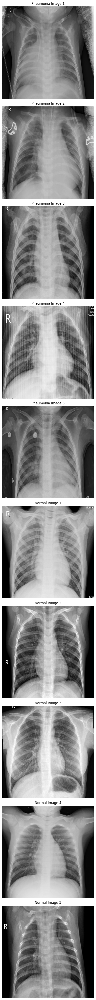

In [ ]:
import matplotlib.pyplot as plt

# テストデータセットのクラスラベルを取得
labels = df_test['class'].values
images = df_test['image'].values

# ラベルに基づいて画像をフィルタリング
pneumonia_indices = [i for i, label in enumerate(labels) if label == 'Pneumonia']
normal_indices = [i for i, label in enumerate(labels) if label == 'Normal']

# 表示する枚数を指定
num_pneumonia = 5  # 表示する肺炎の画像の枚数
num_normal = 5  # 表示する正常の画像の枚数

# 選択した枚数の画像を表示
fig, axes = plt.subplots(num_pneumonia + num_normal, 1, figsize=(10, (num_pneumonia + num_normal) * 5))

for i in range(num_pneumonia):
    index = pneumonia_indices[i]
    medical_image = ds_test[index][0]
    axes[i].imshow(medical_image[0])
    axes[i].set_title(f'Pneumonia Image {i+1}')
    axes[i].axis('off')

for i in range(num_normal):
    index = normal_indices[i]
    medical_image = ds_test[index][0]
    axes[num_pneumonia + i].imshow(medical_image[0])
    axes[num_pneumonia + i].set_title(f'Normal Image {i+1}')
    axes[num_pneumonia + i].axis('off')

plt.tight_layout()
plt.show()


1枚表示してみる

画像枚数: 624
入力index番号: 21


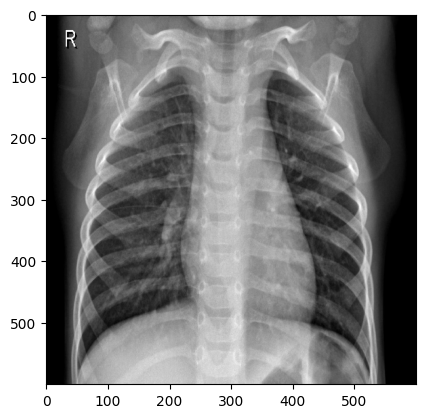

In [ ]:
import matplotlib.pyplot as plt

print(f'画像枚数: {ds_test.n}')

# 見たい画像のインデックス番号を指定する。
index = 21
medical_image = ds_test[index][0]
print(f'入力index番号: {index}')
plt.imshow(medical_image[0])

**EfficientNet(出力をカスタム)を実装**

In [ ]:
'''
既存の学習済みモデルを使用する際には、
レイヤーがネストしないようにする事が望ましい。

ネストしている畳み込みレイヤーに対してCAMを出力しようとした時、
計算グラフが繋がらないケースがあるため。
'''

from tensorflow.keras import layers, Model, metrics
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.losses import binary_crossentropy
import efficientnet.tfkeras as efn
from tensorflow.keras.layers import Input, GlobalAveragePooling2D, Dropout, BatchNormalization, Dense, Activation, Conv2D


input_shape = (600, 600, 3)

# EfficientNetB7 モデルをロード
pretrained_model_B7 = efn.EfficientNetB7(weights='imagenet', input_shape=input_shape, include_top=False)

input_tensor = pretrained_model_B7.input
output_tensor = pretrained_model_B7.output

# 新たに追加。
x = Conv2D(filters=128, kernel_size=(3,3), activation='relu')(output_tensor)

x = GlobalAveragePooling2D()(x)
x = BatchNormalization()(x)
x = Dropout(0.4)(x)
x = Dense(1)(x)
x = BatchNormalization()(x)
x = Activation('sigmoid')(x)


# トレーニング可能なレイヤーを設定
set_trainable = False
for layer in pretrained_model_B7.layers:
    if layer.name == 'block7c_project_conv':
        set_trainable = True
    # if layer.name == 'top_conv':
        # set_trainable = True
    layer.trainable = set_trainable


# モデルをコンパイル
model = Model(inputs=input_tensor, outputs=x)
model.compile(loss=binary_crossentropy,
                  optimizer=Adam(learning_rate=1e-3),
                  metrics=[metrics.AUC(name='auc'), 'accuracy'])


258434480/258434480 [==============================] - 6s 0us/step


In [ ]:
model.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_1 (InputLayer)        [(None, 600, 600, 3)]        0         []                            
                                                                                                  
 stem_conv (Conv2D)          (None, 300, 300, 64)         1728      ['input_1[0][0]']             
                                                                                                  
 stem_bn (BatchNormalizatio  (None, 300, 300, 64)         256       ['stem_conv[0][0]']           
 n)                                                                                               
                                                                                                  
 stem_activation (Activatio  (None, 300, 300, 64)         0         ['stem_bn[0][0]']         

In [ ]:
from tensorflow.keras.utils import plot_model


dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.364341 to fit



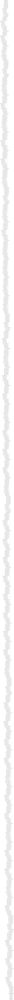

In [ ]:
plot_model(model, to_file='model.png', show_shapes=True, show_layer_names=True)


# **データ拡張、データ全処理**

In [ ]:
# TensorFlowのKerasライブラリからImageDataGeneratorをインポートする。
# ImageDataGeneratorは画像データの前処理やデータ拡張のために使用される。
from tensorflow.keras import callbacks
from tensorflow.keras.callbacks import EarlyStopping

es_callback = EarlyStopping(monitor='val_auc', mode='max', patience=8,
                                              verbose=1, min_delta=0.0001, restore_best_weights=True)

history = model.fit(ds_train,
                    steps_per_epoch=ds_train.samples//BATCH,
                    epochs = 10,
                    validation_data=ds_val,
                    validation_steps=ds_val.samples//BATCH,
                    callbacks= [es_callback],
                    verbose=1)

Epoch 1/10
130/130 [==============================] - 667s 5s/step - loss: 0.4884 - auc: 0.9257 - accuracy: 0.8312 - val_loss: 0.4164 - val_auc: 0.9904 - val_accuracy: 0.8311
Epoch 2/10
130/130 [==============================] - 607s 5s/step - loss: 0.4118 - auc: 0.9631 - accuracy: 0.8954 - val_loss: 0.2803 - val_auc: 0.9932 - val_accuracy: 0.9404
Epoch 3/10
130/130 [==============================] - 607s 5s/step - loss: 0.3621 - auc: 0.9727 - accuracy: 0.9135 - val_loss: 0.2521 - val_auc: 0.9946 - val_accuracy: 0.9561
Epoch 4/10
130/130 [==============================] - 604s 5s/step - loss: 0.3291 - auc: 0.9766 - accuracy: 0.9249 - val_loss: 0.2249 - val_auc: 0.9957 - val_accuracy: 0.9492
Epoch 5/10
130/130 [==============================] - 606s 5s/step - loss: 0.2966 - auc: 0.9818 - accuracy: 0.9343 - val_loss: 0.2041 - val_auc: 0.9961 - val_accuracy: 0.9570
Epoch 6/10
130/130 [==============================] - 604s 5s/step - loss: 0.2731 - auc: 0.9831 - accuracy: 0.9408 - val_loss

精度を検証

In [ ]:
predictions = model.predict(ds_test)


624/624 [==============================] - 74s 101ms/step


In [ ]:
from sklearn.metrics import accuracy_score

accuracy = accuracy_score(ds_test.labels, np.round(predictions))
print(f'The accuracy is {accuracy}')

The accuracy is 0.907051282051282


モデルを保存

In [ ]:
model.save('/content/drive/MyDrive/ColabNotebooks/models/efficientNet_xray4.h5')

NameError: name 'model' is not defined

# **grad-CAMの出力**

学習済みモデルをロード

In [ ]:
from tensorflow.keras.models import load_model

# you need A pre-trained efficientNet model.
import efficientnet.tfkeras as efn


model = load_model("/content/drive/MyDrive/Colab Notebooks/models/efficientNet_xray4.h5")

predictions = model.predict(ds_test)

In [ ]:
predictions = model.predict(ds_test)

624/624 [==============================] - 66s 92ms/step


In [ ]:
predictions

<tf.Tensor: shape=(1, 1), dtype=float32, numpy=array([[0.93058485]], dtype=float32)>

In [ ]:
from sklearn.metrics import accuracy_score

accuracy = accuracy_score(ds_test.labels, np.round(predictions))
print(f'The accuracy is {accuracy}')

The accuracy is 0.907051282051282


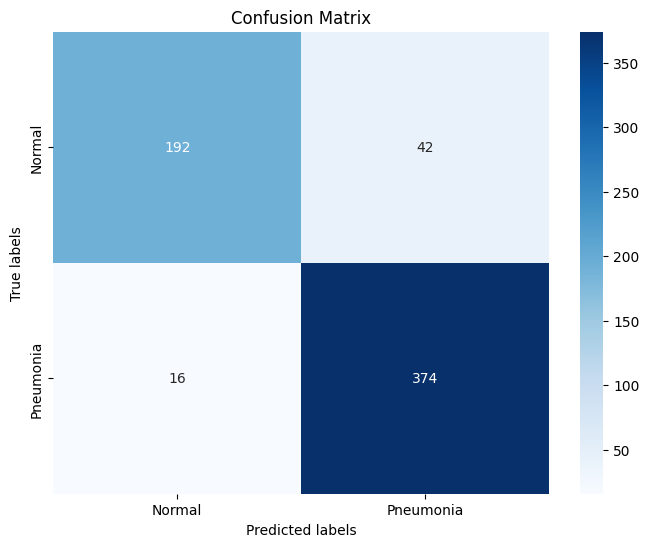

In [ ]:
# テストデータセットの正解ラベルを取得する
true_labels = ds_test.classes
# モデルの予測結果からクラスを決定する（例: 2クラス分類の場合）
predicted_labels = np.round(predictions).flatten()  # 予測結果をフラット化する


# 混合行列を計算する
cm = confusion_matrix(true_labels, predicted_labels)

# クラスラベル
class_names = ['Normal', 'Pneumonia']  # 例としてのクラス名、実際のデータに応じて変更してください

# Matplotlibを使用して混合行列を描画する
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=class_names, yticklabels=class_names)
plt.xlabel('Predicted labels')
plt.ylabel('True labels')
plt.title('Confusion Matrix')
plt.show()

In [ ]:
# モデルの予測結果からクラスを決定する（例: 2クラス分類の場合）
predicted_labels = np.round(predictions).flatten()  # 予測結果をフラット化する

# テストデータセットの正解ラベルを取得する
true_labels = ds_test.classes



In [ ]:
predicted_labels

array([1., 0., 0., 0., 0., 0., 0., 0., 0., 1., 1., 0., 0., 1., 0., 0., 0.,
       0., 1., 0., 0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0., 0., 0., 1.,
       0., 1., 0., 0., 0., 0., 0., 0., 0., 1., 0., 1., 0., 0., 0., 1., 0.,
       1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 1., 0., 1., 1.,
       0., 1., 0., 1., 0., 1., 0., 0., 0., 0., 0., 0., 0., 0., 1., 1., 0.,
       0., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 1., 0., 0.,
       0., 1., 0., 0., 0., 0., 0., 0., 0., 0., 1., 1., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1.,
       1., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0., 0., 0., 0., 0., 1., 0.,
       0., 0., 0., 0., 0., 0., 1., 0., 0., 0., 1., 0., 1., 1., 0., 1., 0.,
       0., 0., 0., 1., 0., 0., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 1., 0., 0., 0., 0., 1., 1., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0.

In [ ]:
# 混合行列を計算する
#cm = confusion_matrix(true_labels, predicted_labels)

# True Positive (TP): 真陽性のインデックスを取得する
tp_indexes = np.where((true_labels == 1) & (predicted_labels == 1))[0]

# False Positive (FP): 偽陽性のインデックスを取得する
fp_indexes = np.where((true_labels == 0) & (predicted_labels == 1))[0]

# True Negative (TN): 真陰性のインデックスを取得する
tn_indexes = np.where((true_labels == 0) & (predicted_labels == 0))[0]

# False Negative (FN): 偽陰性のインデックスを取得する
fn_indexes = np.where((true_labels == 1) & (predicted_labels == 0))[0]

# 各セルに対応するインデックスを表示する
print("True Positive (TP) Image Indexes:")
print(tp_indexes)
print("\nFalse Positive (FP) Image Indexes:")
print(fp_indexes)
print("\nTrue Negative (TN) Image Indexes:")
print(tn_indexes)
print("\nFalse Negative (FN) Image Indexes:")
print(fn_indexes)

True Positive (TP) Image Indexes:
[]

False Positive (FP) Image Indexes:
[]

True Negative (TN) Image Indexes:
[]

False Negative (FN) Image Indexes:
[]


In [ ]:
# モデルの予測結果からクラスを決定する（例: 2クラス分類の場合）
predicted_labels = np.round(predictions).flatten()  # 予測結果をフラット化する

# テストデータセットの正解ラベルを取得する
true_labels = ds_test.classes

# 正しく分類されたインデックスを取得する
correct_indexes = np.where(true_labels == predicted_labels)[0]

# 誤分類されたインデックスを取得する
misclassified_indexes = np.where(true_labels != predicted_labels)[0]

# 正しく分類されたインデックスと誤分類されたインデックスを表示する
print("Correctly Classified Image Indexes:")
print(correct_indexes)
print("\nMisclassified Image Indexes:")
print(misclassified_indexes)

Correctly Classified Image Indexes:
[  1   2   3   4   5   6   7   8  11  12  14  15  16  17  19  20  21  22
  23  24  25  26  28  29  30  31  32  34  36  37  38  39  40  41  42  44
  46  47  48  50  52  53  54  55  56  57  58  59  60  61  62  65  68  70
  72  74  75  76  77  78  79  80  81  84  85  87  88  89  90  91  92  93
  94  95  97  98 100 101 102 104 105 106 107 108 109 110 111 114 115 116
 117 118 119 120 121 122 123 124 125 126 127 128 129 130 131 132 133 134
 137 138 139 140 141 142 144 145 146 147 148 149 150 152 153 154 155 156
 157 158 160 161 162 164 167 169 170 171 172 174 175 177 178 179 180 181
 182 183 184 185 186 187 188 190 191 192 193 196 197 198 199 200 201 202
 203 204 205 206 207 208 209 210 211 212 213 214 216 217 218 219 220 221
 222 223 224 225 226 227 228 229 230 231 232 233 234 235 236 237 238 239
 240 242 243 244 245 246 247 248 249 251 252 254 255 256 257 258 259 260
 261 262 264 265 266 267 268 269 270 271 272 273 274 275 276 277 278 279
 280 281 282 28

In [ ]:
class_names = ['Normal', 'Pneumonia']

# クラスごとに分類されたインデックスを格納するためのリストを初期化
classwise_indexes = {class_name: [] for class_name in class_names}

# 正しく分類されたインデックスをループで処理して、クラスごとに分類する
for idx in correct_indexes:
    true_label = true_labels[idx]
    predicted_label = predicted_labels[idx]
    image_path = ds_test.filepaths[idx]  # もしファイルパスを使っている場合

    # 予測ラベルを元にクラスを決定し、該当するクラスのリストにインデックスを追加する
    if predicted_label == 0:
        classwise_indexes[class_names[0]].append(idx)
    else:
        classwise_indexes[class_names[1]].append(idx)

# クラスごとに分類されたインデックスを表示する
for class_name, indexes in classwise_indexes.items():
    print(f"Class: {class_name}, Correctly Classified Image Indexes:")
    print(indexes)
    print()


Class: Normal, Correctly Classified Image Indexes:
[1, 2, 3, 4, 5, 6, 7, 8, 11, 12, 14, 15, 16, 17, 19, 20, 21, 22, 23, 24, 25, 26, 28, 29, 30, 31, 32, 34, 36, 37, 38, 39, 40, 41, 42, 44, 46, 47, 48, 50, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 65, 68, 70, 72, 74, 75, 76, 77, 78, 79, 80, 81, 84, 85, 87, 88, 89, 90, 91, 92, 93, 94, 95, 97, 98, 100, 101, 102, 104, 105, 106, 107, 108, 109, 110, 111, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 129, 130, 131, 132, 133, 134, 137, 138, 139, 140, 141, 142, 144, 145, 146, 147, 148, 149, 150, 152, 153, 154, 155, 156, 157, 158, 160, 161, 162, 164, 167, 169, 170, 171, 172, 174, 175, 177, 178, 179, 180, 181, 182, 183, 184, 185, 186, 187, 188, 190, 191, 192, 193, 196, 197, 198, 199, 200, 201, 202, 203, 204, 205, 206, 207, 208, 209, 210, 211, 212, 213, 214, 216, 217, 218, 219, 220, 221, 222, 223, 224, 225, 226, 227, 228, 229, 230, 231, 232, 233]

Class: Pneumonia, Correctly Classified Image Indexes:
[234, 235, 236, 2

In [ ]:
import pandas as pd

class_names = ['Normal', 'Pneumonia']

# クラスごとに分類されたインデックスを格納するためのリストを初期化
classwise_indexes = {class_name: [] for class_name in class_names}

# 正しく分類されたインデックスをループで処理して、クラスごとに分類する
for idx in correct_indexes:
    true_label = true_labels[idx]
    predicted_label = predicted_labels[idx]
    image_path = ds_test.filepaths[idx]  # もしファイルパスを使っている場合

    # 予測ラベルを元にクラスを決定し、該当するクラスのリストにインデックスを追加する
    if predicted_label == 0:
        classwise_indexes[class_names[0]].append(idx)
    else:
        classwise_indexes[class_names[1]].append(idx)

# 各クラスごとにDataFrameを作成し、CSVファイルに保存する
for class_name, indexes in classwise_indexes.items():
    # データを準備する
    data = {
        'Index': indexes
    }

    # DataFrameを作成する
    df = pd.DataFrame(data)

    # CSVファイルに保存する
    csv_filename = f'{class_name}_correct_indexes.csv'
    df.to_csv(csv_filename, index=False)

    print(f"{class_name} correctly classified indexes saved to {csv_filename}.")


Normal correctly classified indexes saved to Normal_correct_indexes.csv.
Pneumonia correctly classified indexes saved to Pneumonia_correct_indexes.csv.


In [ ]:
class_names = ['Normal', 'Pneumonia']

# クラスごとに分類されたインデックスを格納するためのリストを初期化
classwise_indexes = {class_name: [] for class_name in class_names}

# 誤分類されたインデックスをループで処理して、クラスごとに分類する
for idx in misclassified_indexes:
    true_label = true_labels[idx]
    predicted_label = predicted_labels[idx]
    image_path = ds_test.filepaths[idx]  # もしファイルパスを使っている場合

    # 予測ラベルを元にクラスを決定し、該当するクラスのリストにインデックスを追加する
    if predicted_label == 0:
        classwise_indexes[class_names[0]].append(idx)
    else:
        classwise_indexes[class_names[1]].append(idx)

# クラスごとに分類されたインデックスを表示する
for class_name, indexes in classwise_indexes.items():
    print(f"Class: {class_name}, Misclassified Image Indexes:")
    print(indexes)
    print()


Class: Normal, Misclassified Image Indexes:
[241, 250, 253, 263, 303, 328, 349, 350, 396, 437, 459, 513, 559, 580, 603, 610]

Class: Pneumonia, Misclassified Image Indexes:
[0, 9, 10, 13, 18, 27, 33, 35, 43, 45, 49, 51, 63, 64, 66, 67, 69, 71, 73, 82, 83, 86, 96, 99, 103, 112, 113, 135, 136, 143, 151, 159, 163, 165, 166, 168, 173, 176, 189, 194, 195, 215]



In [ ]:
import pandas as pd

class_names = ['Normal', 'Pneumonia']

# クラスごとに分類されたインデックスを格納するためのリストを初期化
classwise_indexes = {class_name: [] for class_name in class_names}

# 誤分類されたインデックスをループで処理して、クラスごとに分類する
for idx in misclassified_indexes:
    true_label = true_labels[idx]
    predicted_label = predicted_labels[idx]
    image_path = ds_test.filepaths[idx]  # もしファイルパスを使っている場合

    # 予測ラベルを元にクラスを決定し、該当するクラスのリストにインデックスを追加する
    if predicted_label == 0:
        classwise_indexes[class_names[0]].append(idx)
    else:
        classwise_indexes[class_names[1]].append(idx)

# 各クラスごとにDataFrameを作成し、CSVファイルに保存する
for class_name, indexes in classwise_indexes.items():
    # データを準備する
    data = {
        'Index': indexes
    }

    # DataFrameを作成する
    df = pd.DataFrame(data)

    # CSVファイルに保存する
    csv_filename = f'{class_name}_misclassified_indexes.csv'
    df.to_csv(csv_filename, index=False)

    print(f"{class_name} misclassified indexes saved to {csv_filename}.")



Normal misclassified indexes saved to Normal_misclassified_indexes.csv.
Pneumonia misclassified indexes saved to Pneumonia_misclassified_indexes.csv.


In [ ]:
true_labels

[0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,


Epoch 1/5
130/130 [==============================] - 667s 5s/step - loss: 0.4831 - auc: 0.9305 - accuracy: 0.8309 - val_loss: 0.2114 - val_auc: 0.9934 - val_accuracy: 0.9570
Epoch 2/5
130/130 [==============================] - 607s 5s/step - loss: 0.4080 - auc: 0.9643 - accuracy: 0.8915 - val_loss: 0.4384 - val_auc: 0.9935 - val_accuracy: 0.8242
Epoch 3/5
130/130 [==============================] - 666s 5s/step - loss: 0.3611 - auc: 0.9732 - accuracy: 0.9094 - val_loss: 0.2513 - val_auc: 0.9952 - val_accuracy: 0.9521
Epoch 4/5
130/130 [==============================] - 604s 5s/step - loss: 0.3234 - auc: 0.9801 - accuracy: 0.9298 - val_loss: 0.2904 - val_auc: 0.9949 - val_accuracy: 0.9102
Epoch 5/5
130/130 [==============================] - 667s 5s/step - loss: 0.2953 - auc: 0.9818 - accuracy: 0.9343 - val_loss: 0.1906 - val_auc: 0.9956 - val_accuracy: 0.9658
Validation Loss: 0.1901
Validation AUC: 0.9957
Validation Accuracy: 0.9655


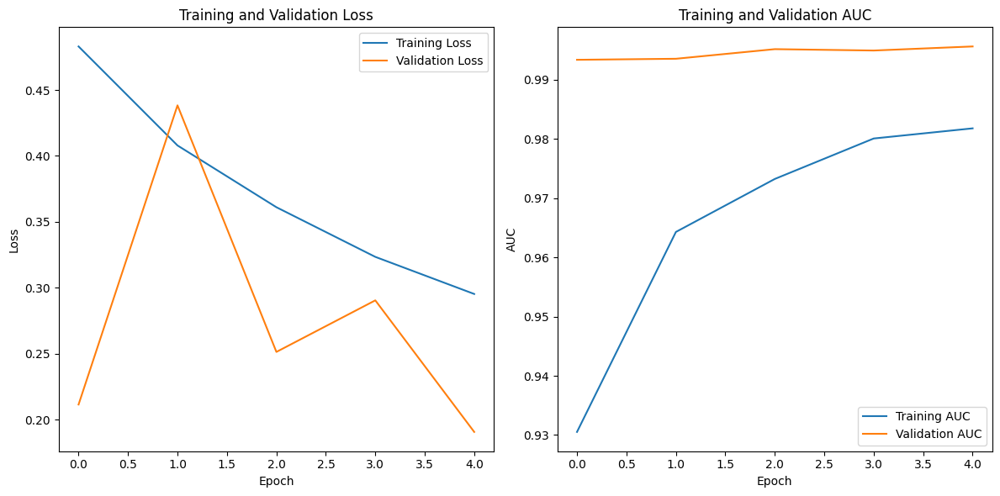

In [ ]:
from tensorflow.keras import callbacks
from tensorflow.keras.callbacks import EarlyStopping
import matplotlib.pyplot as plt

# Early Stoppingコールバックの定義
es_callback = EarlyStopping(monitor='val_auc', mode='max', patience=8,
                            verbose=1, min_delta=0.0001, restore_best_weights=True)

# モデルのトレーニング
history = model.fit(ds_train,
                    steps_per_epoch=ds_train.samples // BATCH,
                    epochs=5,
                    validation_data=ds_val,
                    validation_steps=ds_val.samples // BATCH,
                    callbacks=[es_callback],
                    verbose=1)

# バリデーションデータでの評価
val_loss, val_auc, val_accuracy = model.evaluate(ds_val, verbose=0)

print(f'Validation Loss: {val_loss:.4f}')
print(f'Validation AUC: {val_auc:.4f}')
print(f'Validation Accuracy: {val_accuracy:.4f}')

# 学習履歴のプロット（損失とAUC）
plt.figure(figsize=(12, 6))

# 損失のプロット
plt.subplot(1, 2, 1)
plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Training and Validation Loss')
plt.legend()

# AUCのプロット
plt.subplot(1, 2, 2)
plt.plot(history.history['auc'], label='Training AUC')
plt.plot(history.history['val_auc'], label='Validation AUC')
plt.xlabel('Epoch')
plt.ylabel('AUC')
plt.title('Training and Validation AUC')
plt.legend()

plt.tight_layout()
plt.show()


In [ ]:
test_auc, test_accuracy = model.evaluate(ds_test, verbose=0)

print(f'Test AUC: {test_auc:.4f}')
print(f'Test Accuracy: {test_accuracy:.4f}')

ValueError: too many values to unpack (expected 2)

In [ ]:
from sklearn.metrics import classification_report, confusion_matrix

# テストデータでの予測
y_true = ds_test.classes
y_pred = model.predict(ds_test)
y_pred_classes = (y_pred > 0.5).astype("int32")

# 混同行列
conf_matrix = confusion_matrix(y_true, y_pred_classes)
print("Confusion Matrix:")
print(conf_matrix)

# 分類レポート
class_report = classification_report(y_true, y_pred_classes, target_names=['Normal', 'Bacterial Pneumonia', 'Viral Pneumonia'])
print("Classification Report:")
print(class_report)

入力画像の準備

(1, 600, 600, 3)


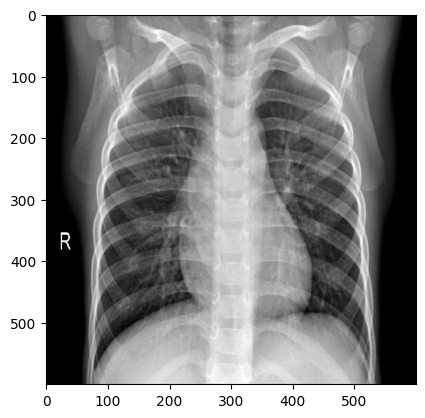

In [ ]:
import tensorflow as tf
import matplotlib.pyplot as plt

# 入力する画像のインデックス指定
idx = 1
input_img = ds_test[idx][0]
# NumPy配列をテンソルに変換
input_img_tensor = tf.convert_to_tensor(input_img.reshape(1, 600, 600, 3))
# 中身を確認
print(input_img.shape)
plt.imshow(input_img[0])

In [ ]:
# ds_test.labels が存在するか確認
if hasattr(ds_test, 'labels'):
    print("Labels found in ds_test")
    print(np.unique(ds_test.labels))
else:
    print("No labels found in ds_test")


Labels found in ds_test
[0 1]


intermediate_modelを作成し、入力画像を予測。  
計算過程をtapeに記録する。

# **Grad-CAMの計算とオーバーレイ表示をする関数**

# **偽陰性と擬陽性の例をランダムに選んでGrad-CAMを計算し、元の画像とオーバーレイ表示**

# **元のコード**

(1, 600, 600, 3)


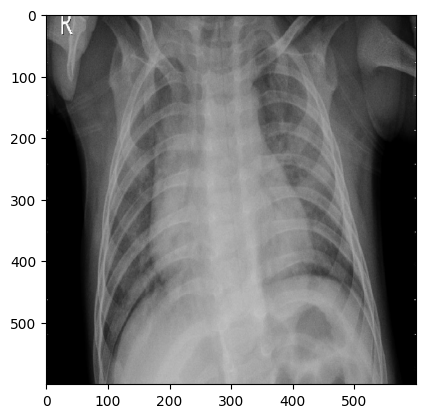

In [ ]:
import tensorflow as tf
import matplotlib.pyplot as plt

# 入力する画像のインデックス指定
idx = 400
input_img = ds_test[idx][0]
# NumPy配列をテンソルに変換
input_img_tensor = tf.convert_to_tensor(input_img.reshape(1, 600, 600, 3))

# 中身を確認
print(input_img.shape)
plt.imshow(input_img[0])

In [ ]:
from tensorflow.keras import Model

# target_layer = model.get_layer("top_conv")
# target_layer = model.get_layer("conv2d")
target_layer = model.get_layer("block7c_project_conv")
intermediate_model = Model(inputs=[model.inputs], outputs=[target_layer.output, model.output])
with tf.GradientTape() as tape:
    tape.watch(input_img_tensor)  # ここでテンソルをwatch
    conv_output, predictions = intermediate_model(input_img_tensor)
    class_idx = np.argmax(predictions[0])
    loss = predictions[:, class_idx]

print(loss)


tf.Tensor([0.889562], shape=(1,), dtype=float32)


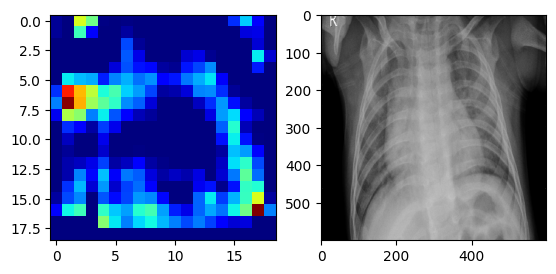

In [ ]:
# 勾配を取得
# 通常の勾配の計算(誤差を重みで微分)とは異なり、grad_CAMでは、対象クラスの誤差を特徴マップで微分している。
grads = tape.gradient(loss, conv_output)[0]

# グローバル平均プーリング
# ここでのweights(重み)は、通常の機械学習の文脈における重みではなく、
# Grad-CAMの文脈で特定の特徴マップがどれだけ重要であるかを示す量。
weights = np.mean(grads, axis=(0, 1))

# Grad-CAMの計算
# conv_output[0]はバッチのindex0番目に対応している。今回は１枚のみなので[0]のみ存在している。
cam = np.dot(conv_output[0], weights)
cam = np.maximum(cam, 0)  # ReLU
cam = cam / cam.max()  # 正規化

# 可視化
plt.subplot(121)
plt.imshow(cam, cmap="jet")

plt.subplot(122)
plt.imshow(input_img[0], cmap='gray')

plt.show()


# **カラーマップ作成、画像を合成**

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors

from tensorflow.keras import Model

# target_layer = model.get_layer("top_conv")
# target_layer = model.get_layer("conv2d")
target_layer = model.get_layer("block7c_project_conv")
intermediate_model = Model(inputs=[model.inputs], outputs=[target_layer.output, model.output])
with tf.GradientTape() as tape:
    tape.watch(input_img_tensor)  # ここでテンソルをwatch
    conv_output, predictions = intermediate_model(input_img_tensor)
    class_idx = np.argmax(predictions[0])
    loss = predictions[:, class_idx]

print(loss)

tf.Tensor([0.889562], shape=(1,), dtype=float32)


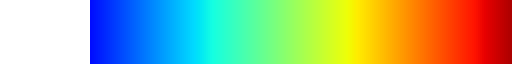

In [ ]:
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors

cmap = plt.get_cmap('jet')
cmaplist = [cmap(i) for i in range(cmap.N)]

# 範囲を変更
shift_amount = 10
new_cmaplist = [(1, 1, 1, 0.0) for _ in range(shift_amount)] + cmaplist[:-shift_amount]


for i in range(45):
    new_cmaplist[i] = (1, 1, 1, 0.0)  # (R, G, B, Alpha)


cmap_custom = mcolors.LinearSegmentedColormap.from_list('custom_cmap', new_cmaplist, cmap.N)
cmap_custom


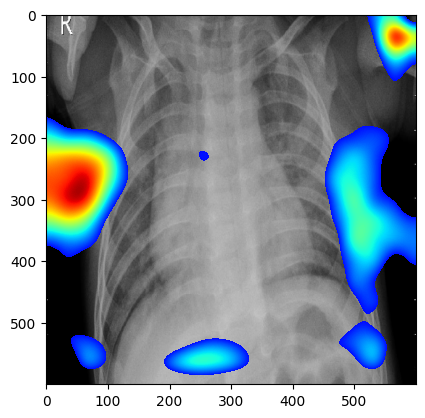

In [ ]:
import matplotlib.colors as mcolors


# 元の画像
plt.imshow(input_img[0], cmap='gray')
# CAMを透過してオーバーレイ表示
plt.imshow(cam_resized, cmap=cmap_custom, alpha=1, vmin=0)

plt.show()

In [ ]:
import tensorflow as tf
import matplotlib.pyplot as plt

# 入力する画像のインデックス指定
idx = 400
input_img = ds_test[idx][0]
# NumPy配列をテンソルに変換
input_img_tensor = tf.convert_to_tensor(input_img.reshape(1, 600, 600, 3))

# 中身を確認
print(input_img.shape)
plt.imshow(input_img[0])

# **複数ver**

In [ ]:
from tensorflow.keras.models import load_model

# you need A pre-trained efficientNet model.
import efficientnet.tfkeras as efn


model = load_model("/content/drive/MyDrive/ColabNotebooks/models/efficientNet_xray4.h5")

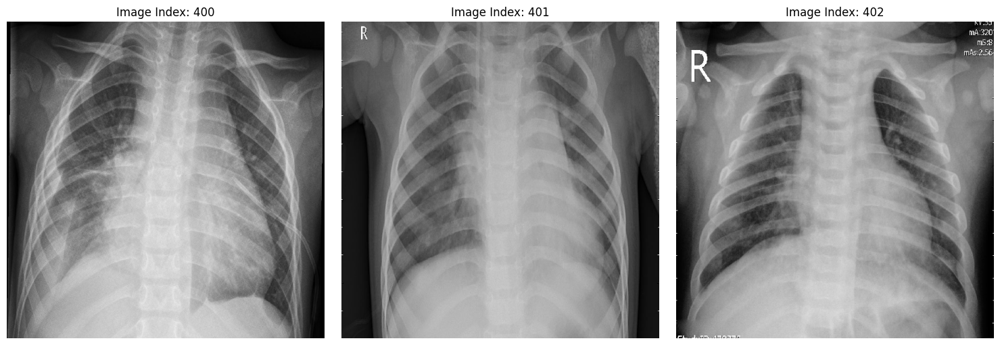

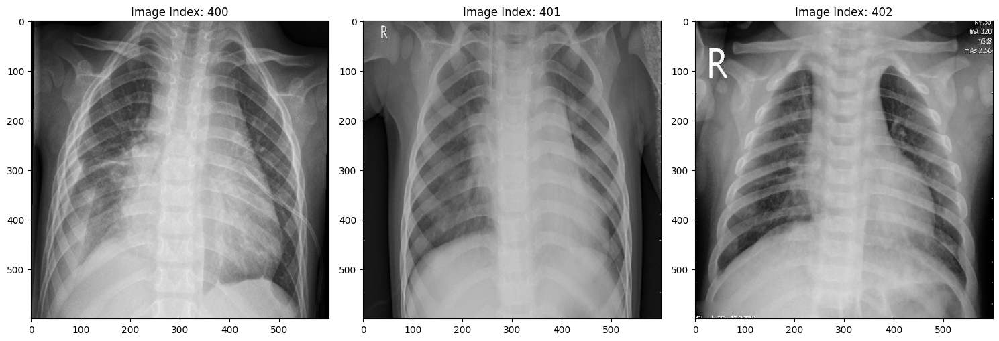

In [ ]:
import tensorflow as tf
import matplotlib.pyplot as plt

# 表示する画像のインデックスをリストで入力（例）
image_indexes = [400, 401, 402]

# 表示する画像の数
num_images = len(image_indexes)

# 画像を連続して表示するループ
fig, axes = plt.subplots(1, num_images, figsize=(15, 5))  # 1行に複数の画像を表示する設定

for i, idx in enumerate(image_indexes):
    input_img = ds_test[idx][0]  # 指定したインデックスの画像を取得
    # NumPy配列をテンソルに変換
    input_img_tensor = tf.convert_to_tensor(input_img.reshape(1, 600, 600, 3))
    # 画像の表示
    axes[i].imshow(input_img_tensor.numpy().squeeze())  # 各サブプロットに画像を表示
    axes[i].set_title(f"Image Index: {idx}")  # タイトルに画像のインデックスを表示
    axes[i].axis('off')  # 軸を表示しない設定

plt.tight_layout()  # レイアウトを調整して重なりを避ける
plt.show()  # 画像を表示
import tensorflow as tf
import matplotlib.pyplot as plt

# 表示する画像のインデックスをリストで入力（例）
image_indexes = [400, 401, 402]

# 表示する画像の数
num_images = len(image_indexes)

# 画像を連続して表示するループ
fig, axes = plt.subplots(1, num_images, figsize=(15, 5))  # 1行に複数の画像を表示する設定

for i, idx in enumerate(image_indexes):
    input_img = ds_test[idx][0]  # 指定したインデックスの画像を取得
    # NumPy配列をテンソルに変換
    input_img_tensor = tf.convert_to_tensor(input_img.reshape(1, 600, 600, 3))
    # 画像の表示
    axes[i].imshow(input_img_tensor.numpy().squeeze())  # 各サブプロットに画像を表示
    axes[i].set_title(f"Image Index: {idx}")  # タイトルに画像のインデックスを表示
    axes[i].axis('on')  # 軸を表示しない設定

plt.tight_layout()  # レイアウトを調整して重なりを避ける
plt.show()  # 画像を表示


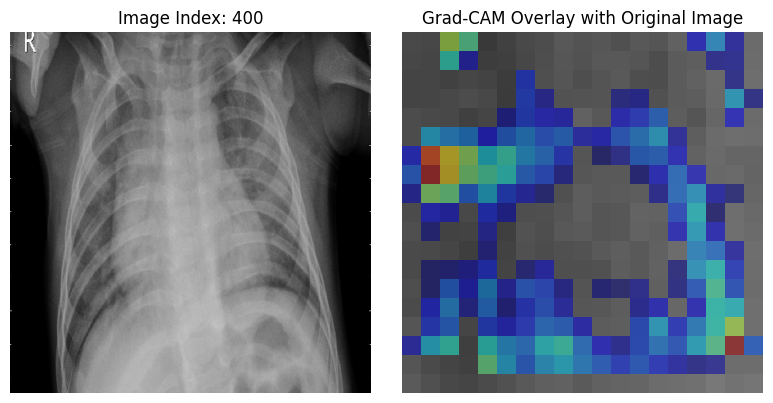

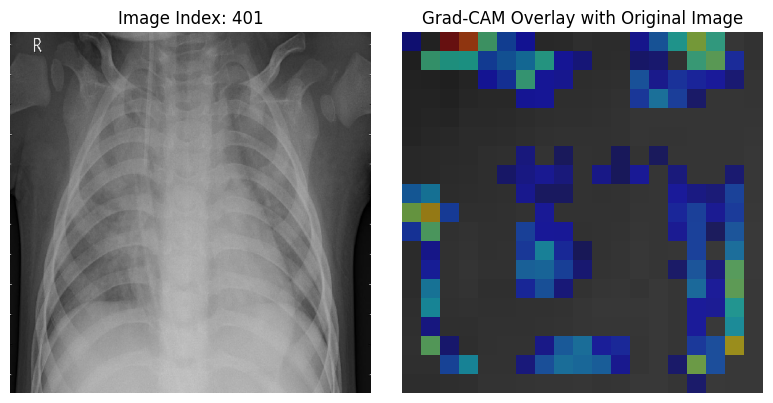

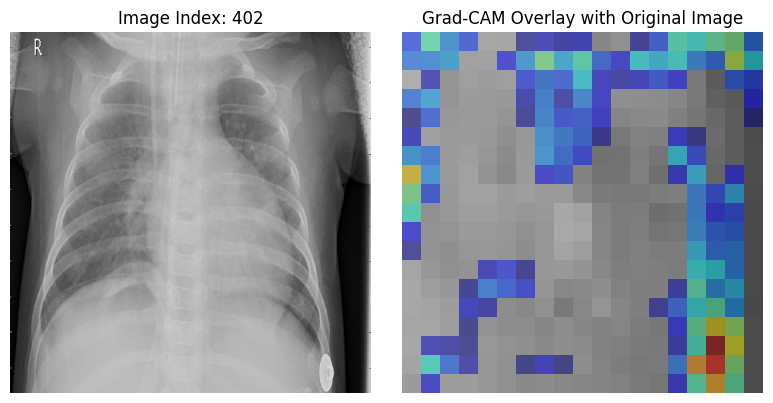

In [ ]:
import tensorflow as tf
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
from tensorflow.keras import Model

# Grad-CAMを計算する関数
def compute_grad_cam(model, ds_test, idx, target_layer_name):
    # 画像を取得してテンソルに変換
    input_img = ds_test[idx][0]
    input_img_tensor = tf.convert_to_tensor(input_img.reshape(1, 600, 600, 3))

    # Grad-CAMを計算するターゲットレイヤーの指定
    target_layer = model.get_layer(target_layer_name)
    intermediate_model = Model(inputs=[model.inputs], outputs=[target_layer.output, model.output])

    # Grad-CAMの計算
    with tf.GradientTape() as tape:
        tape.watch(input_img_tensor)
        conv_output, predictions = intermediate_model(input_img_tensor)
        class_idx = np.argmax(predictions[0])
        loss = predictions[:, class_idx]

    grads = tape.gradient(loss, conv_output)[0]
    weights = np.mean(grads, axis=(0, 1))
    cam = np.dot(conv_output[0], weights)
    cam = np.maximum(cam, 0)  # ReLU
    cam = cam / cam.max()  # 正規化

    return input_img[0], cam

# カスタムカラーマップの作成
cmap = plt.get_cmap('jet')
cmaplist = [cmap(i) for i in range(cmap.N)]

shift_amount = 10
new_cmaplist = [(1, 1, 1, 0.0) for _ in range(shift_amount)] + cmaplist[:-shift_amount]

for i in range(shift_amount):
    new_cmaplist[i] = (1, 1, 1, 0.0)

cmap_custom = mcolors.LinearSegmentedColormap.from_list('custom_cmap', new_cmaplist, cmap.N)

# Grad-CAMの可視化と元の画像と重ねて表示
image_indexes = [400, 401, 402]  # 表示する画像のインデックス

for idx in image_indexes:
    input_img, cam = compute_grad_cam(model, ds_test, idx, "block7c_project_conv")

    # 元の画像を表示
    plt.figure(figsize=(8, 4))
    plt.subplot(1, 2, 1)
    plt.imshow(input_img, cmap='gray')
    plt.title(f"Image Index: {idx}")
    plt.axis('off')

    # Grad-CAMをオーバーレイして表示
    plt.subplot(1, 2, 2)
    plt.imshow(input_img, cmap='gray')
    plt.imshow(cam, cmap=cmap_custom, alpha=0.5)  # Grad-CAMを透明度を調整してオーバーレイ
    plt.title('Grad-CAM Overlay with Original Image')
    plt.axis('off')

    plt.tight_layout()
    plt.show()


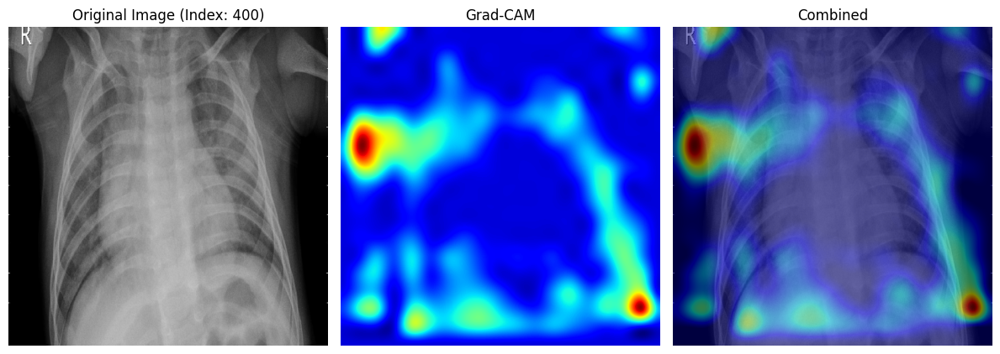

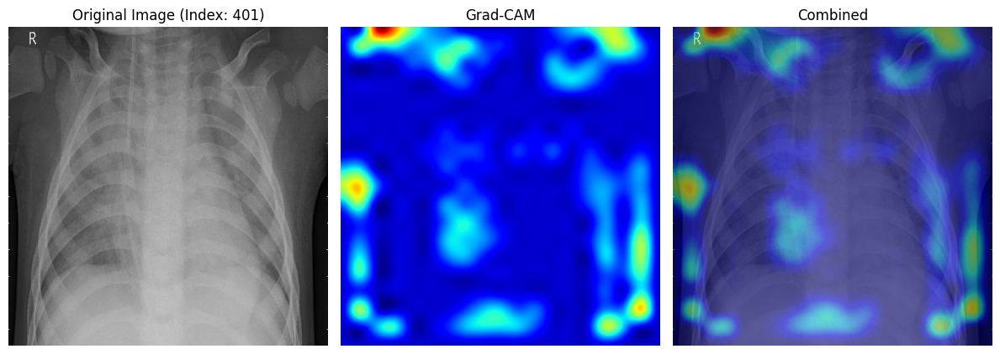

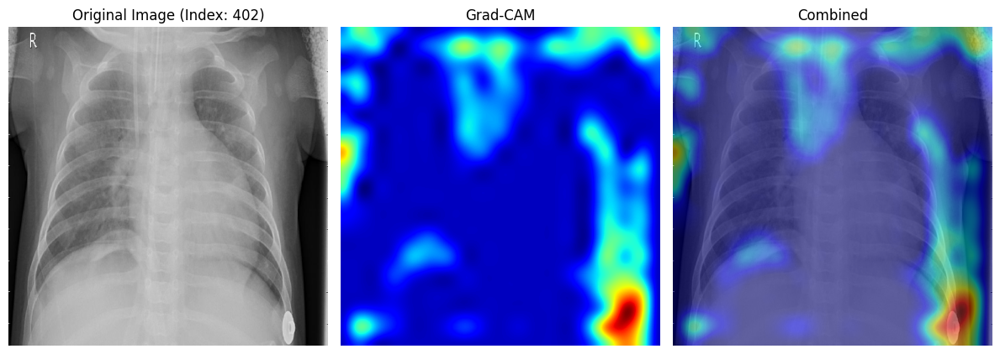

In [ ]:
from scipy.ndimage import zoom
import matplotlib.pyplot as plt
import numpy as np
import matplotlib.colors as mcolors
import tensorflow as tf
from tensorflow.keras import Model

# Grad-CAMを計算する関数
def compute_grad_cam(model, ds_test, idx, target_layer_name):
    # 画像を取得してテンソルに変換
    input_img = ds_test[idx][0]
    input_img_tensor = tf.convert_to_tensor(input_img.reshape(1, 600, 600, 3))

    # Grad-CAMを計算するターゲットレイヤーの指定
    target_layer = model.get_layer(target_layer_name)
    intermediate_model = Model(inputs=[model.inputs], outputs=[target_layer.output, model.output])

    # Grad-CAMの計算
    with tf.GradientTape() as tape:
        tape.watch(input_img_tensor)
        conv_output, predictions = intermediate_model(input_img_tensor)
        class_idx = np.argmax(predictions[0])
        loss = predictions[:, class_idx]

    grads = tape.gradient(loss, conv_output)[0]
    weights = np.mean(grads, axis=(0, 1))
    cam = np.dot(conv_output[0], weights)
    cam = np.maximum(cam, 0)  # ReLU
    cam = cam / cam.max()  # 正規化

    return input_img[0], cam

# カスタムカラーマップの作成
cmap = plt.get_cmap('jet')
cmaplist = [cmap(i) for i in range(cmap.N)]

shift_amount = 10
new_cmaplist = [(1, 1, 1, 0.0) for _ in range(shift_amount)] + cmaplist[:-shift_amount]

for i in range(shift_amount):
    new_cmaplist[i] = (1, 1, 1, 0.0)

cmap_custom = mcolors.LinearSegmentedColormap.from_list('custom_cmap', new_cmaplist, cmap.N)

# Grad-CAMの可視化と元の画像と重ねて表示
image_indexes = [400, 401, 402]  # 表示する画像のインデックス

for idx in image_indexes:
    input_img, cam = compute_grad_cam(model, ds_test, idx, "block7c_project_conv")

    # Grad-CAMをアップサンプリングして調整
    zoom_factor = 600 / 19  # ターゲットのサイズ: 600, 元のサイズ: 19
    cam_resized = zoom(cam, zoom_factor)

    # 元の画像を表示
    plt.figure(figsize=(12, 6))

    plt.subplot(1, 3, 1)
    plt.imshow(input_img, cmap='gray')
    plt.title(f"Original Image (Index: {idx})")
    plt.axis('off')

    # Grad-CAMを表示
    plt.subplot(1, 3, 2)
    plt.imshow(cam_resized, cmap='jet')
    plt.title("Grad-CAM")
    plt.axis('off')

    # 元の画像とGrad-CAMを重ねて表示
    plt.subplot(1, 3, 3)
    plt.imshow(input_img, cmap='gray')
    plt.imshow(cam_resized, cmap='jet',  alpha=0.5, vmin=0)
    plt.title("Combined")
    plt.axis('off')

    plt.tight_layout()
    plt.show()


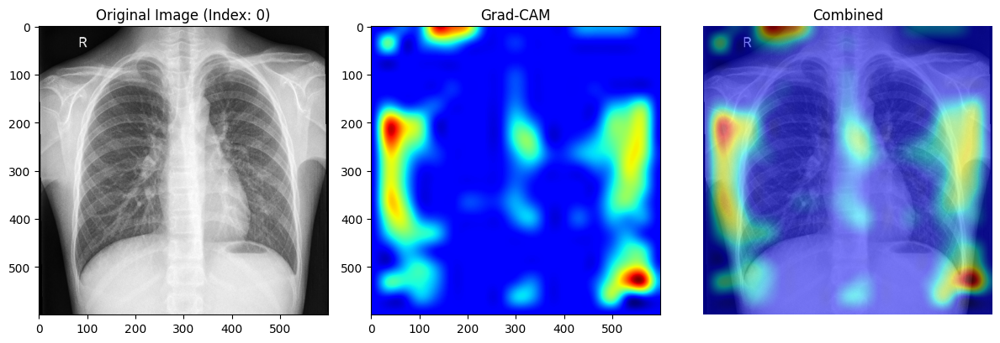

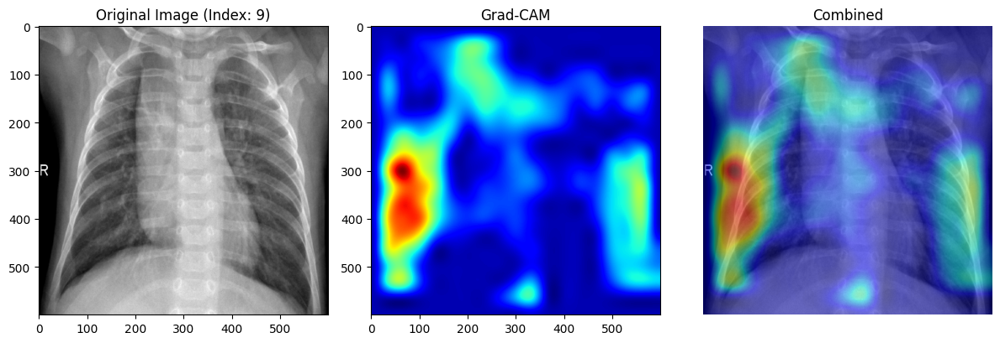

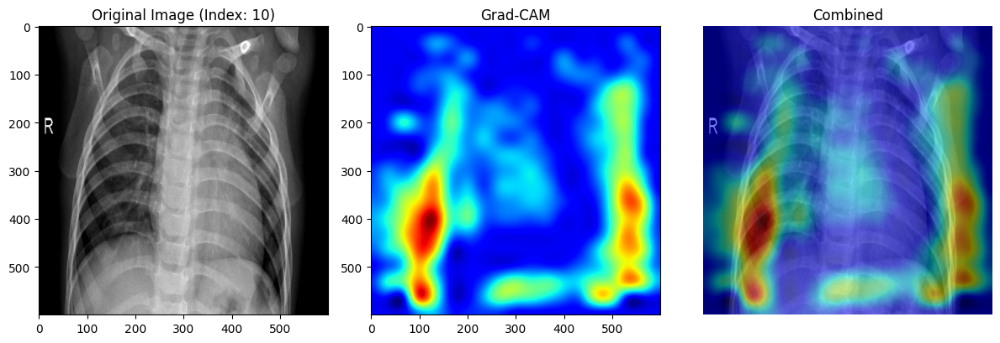

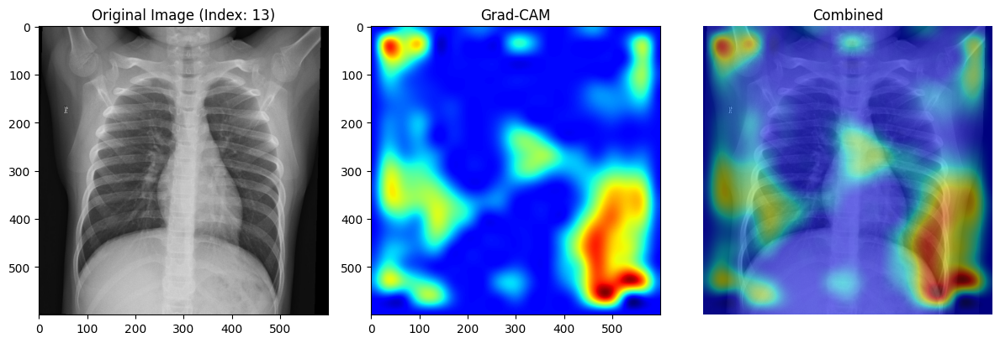

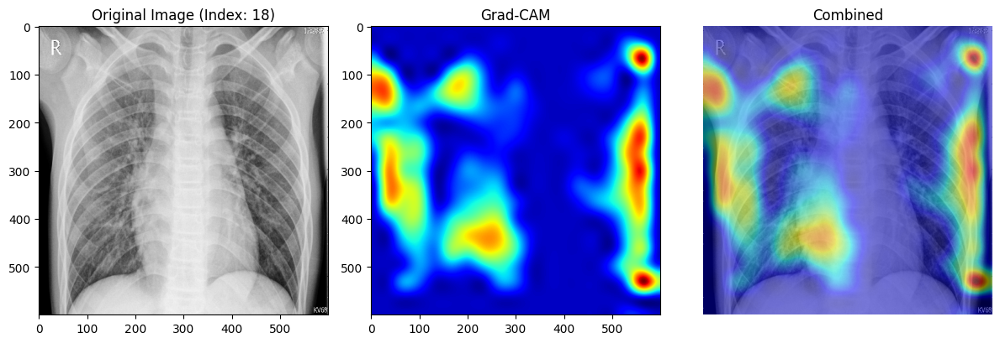

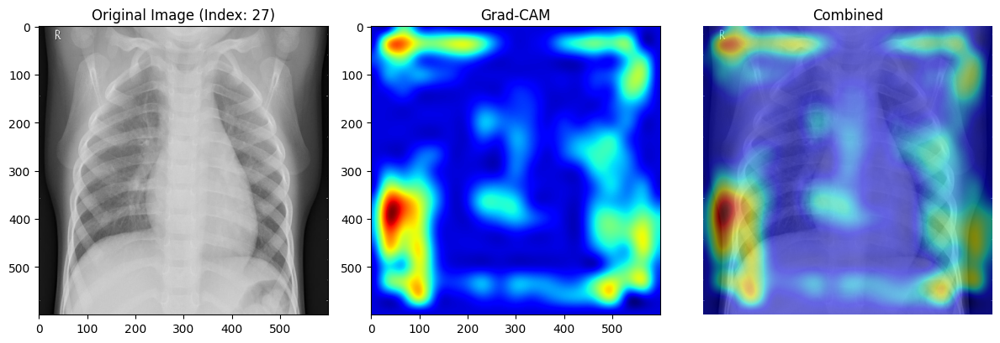

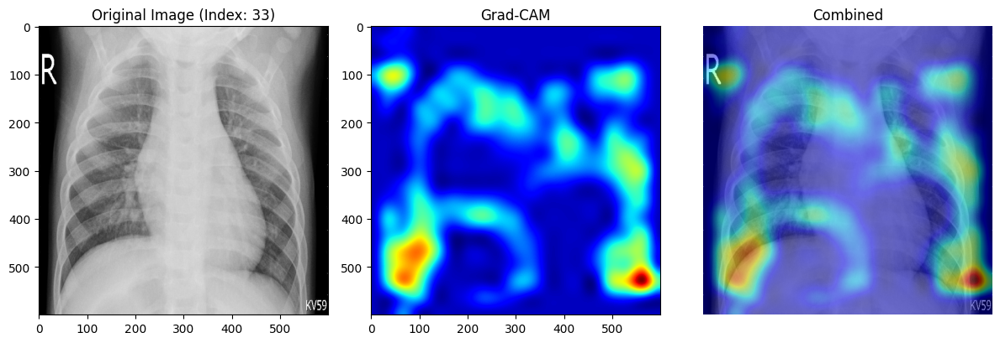

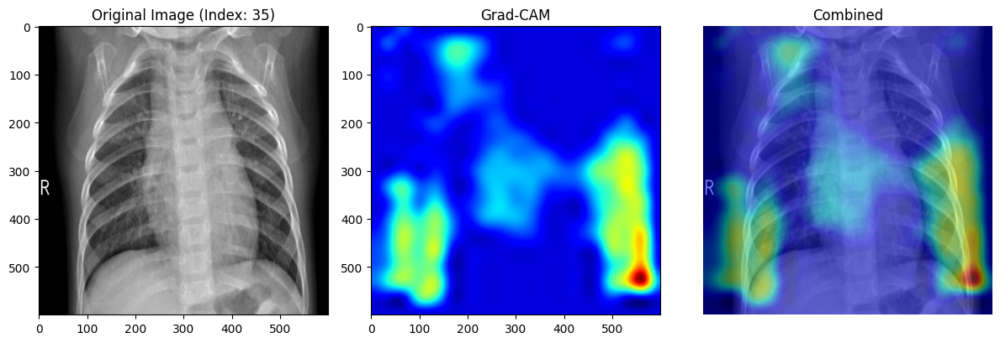

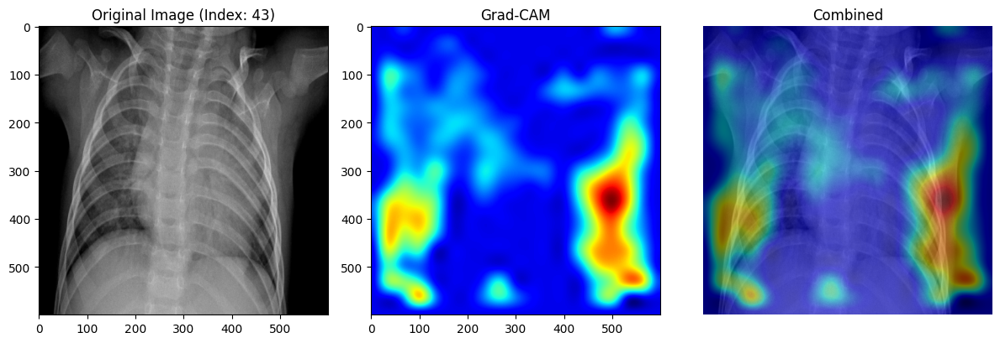

In [17]:
from scipy.ndimage import zoom
import matplotlib.pyplot as plt
import numpy as np
import matplotlib.colors as mcolors
import tensorflow as tf
from tensorflow.keras import Model

# Grad-CAMを計算する関数
def compute_grad_cam(model, ds_test, idx, target_layer_name):
    # 画像を取得してテンソルに変換
    input_img = ds_test[idx][0]
    input_img_tensor = tf.convert_to_tensor(input_img.reshape(1, 600, 600, 3))

    # Grad-CAMを計算するターゲットレイヤーの指定
    target_layer = model.get_layer(target_layer_name)
    intermediate_model = Model(inputs=[model.inputs], outputs=[target_layer.output, model.output])

    # Grad-CAMの計算
    with tf.GradientTape() as tape:
        tape.watch(input_img_tensor)
        conv_output, predictions = intermediate_model(input_img_tensor)
        class_idx = np.argmax(predictions[0])
        loss = predictions[:, class_idx]

    grads = tape.gradient(loss, conv_output)[0]
    weights = np.mean(grads, axis=(0, 1))
    cam = np.dot(conv_output[0], weights)
    cam = np.maximum(cam, 0)  # ReLU
    cam = cam / cam.max()  # 正規化

    return input_img[0], cam

# カスタムカラーマップの作成
cmap = plt.get_cmap('jet')
cmaplist = [cmap(i) for i in range(cmap.N)]

shift_amount = 10
new_cmaplist = [(1, 1, 1, 0.0) for _ in range(shift_amount)] + cmaplist[:-shift_amount]

for i in range(shift_amount):
    new_cmaplist[i] = (1, 1, 1, 0.0)

cmap_custom = mcolors.LinearSegmentedColormap.from_list('custom_cmap', new_cmaplist, cmap.N)

# Grad-CAMの可視化と元の画像と重ねて表示
#image_indexes = [241,250,253]  # 表示する画像のインデックス
#image_indexes = [234,235,236]
#image_indexes = [0,9,10]
#image_indexes = [1,2,3,4,5,6,7,8,11,12]
#image_indexes = [234,235,236,237,238,239,240,242,243,244]
image_indexes = [0,9,10,13,18,27,33,35,43]
for idx in image_indexes:
    input_img, cam = compute_grad_cam(model, ds_test, idx, "block7c_project_conv")

    # Grad-CAMをアップサンプリングして調整
    zoom_factor = 600 / 19  # ターゲットのサイズ: 600, 元のサイズ: 19
    cam_resized = zoom(cam, zoom_factor)

    # 元の画像を表示
    plt.figure(figsize=(12, 6))

    plt.subplot(1, 3, 1)
    plt.imshow(input_img, cmap='gray')
    plt.title(f"Original Image (Index: {idx})")
    plt.axis('on')

    # Grad-CAMを表示
    plt.subplot(1, 3, 2)
    plt.imshow(cam_resized, cmap='jet')
    plt.title("Grad-CAM")
    plt.axis('on')

    # 元の画像とGrad-CAMを重ねて表示
    plt.subplot(1, 3, 3)
    plt.imshow(input_img, cmap='gray')
    plt.imshow(cam_resized, cmap='jet', alpha=0.5)
    plt.title("Combined")
    plt.axis('off')

    plt.tight_layout()
    plt.show()


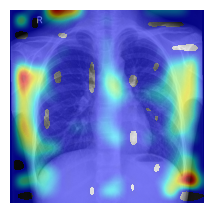

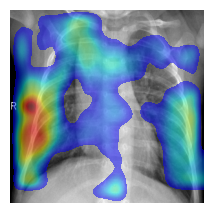

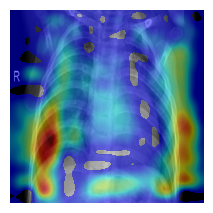

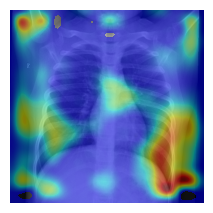

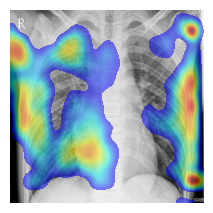

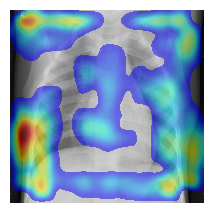

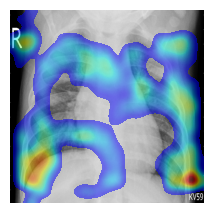

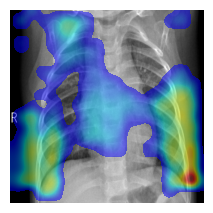

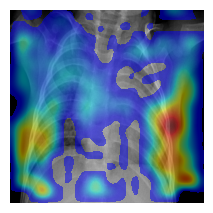

Images saved to /content/drive/My Drive


In [18]:
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
from scipy.ndimage import zoom
import numpy as np
import tensorflow as tf
from tensorflow.keras import Model
import os  # Import the os module for file operations

# Define the directory to save images
save_dir = '/content/drive/My Drive'  # Update this path to your desired directory

# Ensure the save directory exists
os.makedirs(save_dir, exist_ok=True)

# Your existing code for Grad-CAM computation and visualization
# Grad-CAMを計算する関数
def compute_grad_cam(model, ds_test, idx, target_layer_name):
    # 画像を取得してテンソルに変換
    input_img = ds_test[idx][0]
    input_img_tensor = tf.convert_to_tensor(input_img.reshape(1, 600, 600, 3))

    # Grad-CAMを計算するターゲットレイヤーの指定
    target_layer = model.get_layer(target_layer_name)
    intermediate_model = Model(inputs=[model.inputs], outputs=[target_layer.output, model.output])

    # Grad-CAMの計算
    with tf.GradientTape() as tape:
        tape.watch(input_img_tensor)
        conv_output, predictions = intermediate_model(input_img_tensor)
        class_idx = np.argmax(predictions[0])
        loss = predictions[:, class_idx]

    grads = tape.gradient(loss, conv_output)[0]
    weights = np.mean(grads, axis=(0, 1))
    cam = np.dot(conv_output[0], weights)
    cam = np.maximum(cam, 0)  # ReLU
    cam = cam / cam.max()  # 正規化

    return input_img[0], cam

# カスタムカラーマップの作成
def create_custom_cmap(shift_amount=0.1):
    cmap = plt.get_cmap('jet')
    cmaplist = [cmap(i) for i in range(cmap.N)]

    # カスタムカラーマップを作成
    new_cmaplist = [(1, 1, 1, 0.0) if i < int(cmap.N * shift_amount) else cmaplist[i] for i in range(cmap.N)]
    cmap_custom = mcolors.LinearSegmentedColormap.from_list('custom_cmap', new_cmaplist, cmap.N)

    return cmap_custom

# Grad-CAMの可視化と元の画像と重ねて表示
cmap_custom = create_custom_cmap(shift_amount=0.1)

for idx in image_indexes:
    input_img, cam = compute_grad_cam(model, ds_test, idx, "block7c_project_conv")
    zoom_factor = 600 / 19
    cam_resized = zoom(cam, zoom_factor)

    plt.subplot(1, 3, 3)
    plt.imshow(input_img, cmap='gray')
    plt.imshow(cam_resized, cmap=cmap_custom, alpha=0.5)
    plt.axis('off')
    plt.tight_layout()

    # Save the figure
    save_path = os.path.join(save_dir, f'image_{idx}.png')
    plt.savefig(save_path)

    plt.show()  # Optionally, show the plot (comment out if you only want to save)

    plt.close()  # Close the plot to release memory

print(f"Images saved to {save_dir}")


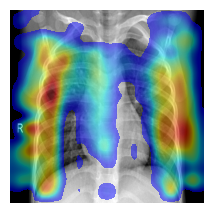

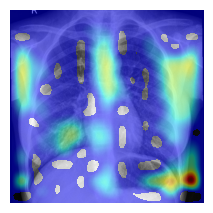

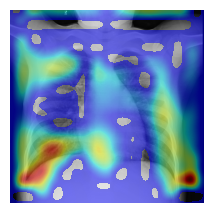

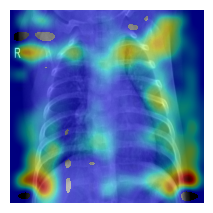

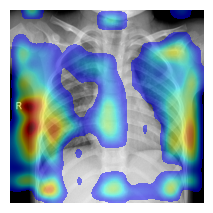

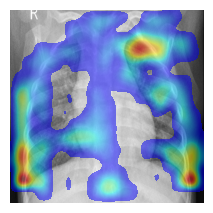

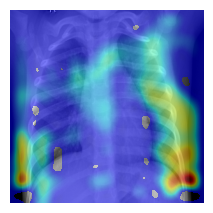

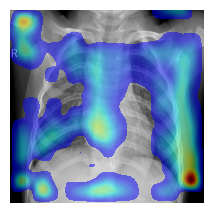

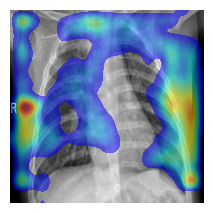

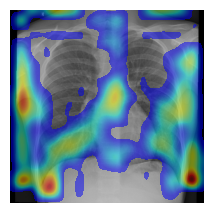

In [ ]:
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
from scipy.ndimage import zoom
import numpy as np
import tensorflow as tf
from tensorflow.keras import Model

# Grad-CAMを計算する関数
def compute_grad_cam(model, ds_test, idx, target_layer_name):
    # 画像を取得してテンソルに変換
    input_img = ds_test[idx][0]
    input_img_tensor = tf.convert_to_tensor(input_img.reshape(1, 600, 600, 3))

    # Grad-CAMを計算するターゲットレイヤーの指定
    target_layer = model.get_layer(target_layer_name)
    intermediate_model = Model(inputs=[model.inputs], outputs=[target_layer.output, model.output])

    # Grad-CAMの計算
    with tf.GradientTape() as tape:
        tape.watch(input_img_tensor)
        conv_output, predictions = intermediate_model(input_img_tensor)
        class_idx = np.argmax(predictions[0])
        loss = predictions[:, class_idx]

    grads = tape.gradient(loss, conv_output)[0]
    weights = np.mean(grads, axis=(0, 1))
    cam = np.dot(conv_output[0], weights)
    cam = np.maximum(cam, 0)  # ReLU
    cam = cam / cam.max()  # 正規化

    return input_img[0], cam

# カスタムカラーマップの作成
def create_custom_cmap(shift_amount=0.1):
    cmap = plt.get_cmap('jet')
    cmaplist = [cmap(i) for i in range(cmap.N)]

    # カスタムカラーマップを作成
    new_cmaplist = [(1, 1, 1, 0.0) if i < int(cmap.N * shift_amount) else cmaplist[i] for i in range(cmap.N)]
    cmap_custom = mcolors.LinearSegmentedColormap.from_list('custom_cmap', new_cmaplist, cmap.N)

    return cmap_custom

# Grad-CAMの可視化と元の画像と重ねて表示
#image_indexes = [241,250,253]
#image_indexes = [0,9,10]  # 表示する画像のインデックス
#image_indexes = [4,5,6,7,8,11,12]
cmap_custom = create_custom_cmap(shift_amount=0.1)  # 反応が弱い部分を透明にするためのカスタムカラーマップ

for idx in image_indexes:
    input_img, cam = compute_grad_cam(model, ds_test, idx, "block7c_project_conv")

    # Grad-CAMをアップサンプリングして調整
    zoom_factor = 600 / 19  # ターゲットのサイズ: 600, 元のサイズ: 19
    cam_resized = zoom(cam, zoom_factor)

    # 元の画像とGrad-CAMを重ねて表示
    plt.subplot(1, 3, 3)
    plt.imshow(input_img, cmap='gray')
    plt.imshow(cam_resized, cmap=cmap_custom, alpha=0.5)
    #plt.title("Combined")
    plt.axis('off')

    plt.tight_layout()
    plt.show()
